<a href="https://colab.research.google.com/github/eghrthrjdtsed/-------------------------/blob/master/Home_work_7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Обнаружение объектов с помощью KerasCV

**Автор:** [lukewood](https://twitter.com/luke_wood_ml), Ян Стенбит, Тирт Патель<br>
**Дата создания:** 08.04.2023<br>
**Последнее изменение:** 10 августа 2023 г.<br>
**Описание:** Обучение модели обнаружения объектов с помощью KerasCV.

KerasCV предлагает полный набор API-интерфейсов производственного уровня для решения проблем обнаружения объектов. Эти API включают в себя методы увеличения данных, специфичные для обнаружения объектов, собственные метрики COCO Keras, утилиты преобразования формата ограничительной рамки, инструменты визуализации, предварительно обученные модели обнаружения объектов и все, что вам нужно для обучения ваших собственных современных моделей обнаружения объектов!

Давайте попробуем API обнаружения объектов KerasCV.

In [4]:
!pip install -q --upgrade keras-cv
!pip install -q --upgrade keras  # Upgrade to Keras 3.

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.1.0 which is incompatible.


In [5]:
import os

os.environ["KERAS_BACKEND"] = "jax"  # @param ["tensorflow", "jax", "torch"]

from tensorflow import data as tf_data
import tensorflow_datasets as tfds
import keras
import keras_cv.models
import numpy as np
from keras_cv import bounding_box
import os
from keras_cv import visualization
import tqdm

## Введение в обнаружение объектов

Обнаружение объектов — это процесс идентификации, классификации и локализации объектов на данном изображении. Обычно входными данными являются изображения, а метки — ограничивающие рамки с необязательными метками классов. Обнаружение объектов можно рассматривать как расширение классификации, однако вместо одной метки класса для изображения необходимо обнаружить и локализовать произвольное количество классов.

**Например:**

<img width="300" src="https://i.imgur.com/8xSEbQD.png">

Данные для изображения выше могут выглядеть примерно так:
``` image = [height, width, 3]
bounding_boxes = {
  "classes": [0], # 0 is an arbitrary class ID representing "cat"
  "boxes": [[0.25, 0.4, .15, .1]]
   # bounding box is in "rel_xywh" format
   # so 0.25 represents the start of the bounding box 25% of
   # the way across the image.
   # The .15 represents that the width is 15% of the image width.
}
```

С момента создания [*You Only Look Once*](https://arxiv.org/abs/1506.02640)
(он же ЙОЛО),
Обнаружение объектов в основном решалось с помощью глубокого обучения.
Большинство архитектур глубокого обучения делают это, умело определяя обнаружение объектов.
проблема как комбинация многих небольших задач классификации и
множество проблем с регрессией.

Точнее, это делается путем создания множества якорных блоков разной
формы и размеры входных изображений и присвоение каждому из них метки класса,
а также смещения `x`, `y`, `width` и `height`.
Модель обучена прогнозировать метки классов каждого ящика, а также
Смещения `x`, `y`, `width` и `height` для каждого блока, который, по прогнозам, будет
объект.

**Визуализация некоторых примеров полей привязки**:

<img width="400" src="https://i.imgur.com/cJIuiK9.jpg">

Обнаружение возражений — технически сложная задача, но, к счастью, мы предлагаем
надежный подход к получению отличных результатов.
Давай сделаем это!

## Выполнение обнаружения с помощью предварительно обученной модели

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_beginner.png)

API самого высокого уровня в API обнаружения объектов KerasCV — это API keras_cv.models.
Этот API включает в себя полностью предварительно обученные модели обнаружения объектов, такие как
`keras_cv.models.YOLOV8Detector`.

Давайте начнем с создания детектора YOLOV8, предварительно обученного на pascalvoc.
набор данных.

In [2]:
!pip install tensorflow

In [6]:
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh"
)

100%|██████████| 99.5M/99.5M [00:03<00:00, 29.6MB/s]


Обратите внимание на аргумент «bounding_box_format»?

Напомним, в разделе выше описан формат ограничивающих рамок:

```
bounding_boxes = {
  "классы": [num_boxes],
  "коробки": [num_boxes, 4]
}
```

Этот аргумент *точно* описывает формат значений в `"полях"`
поле словаря меток возьмите в свой конвейер.
Например, прямоугольник в формате xywh с левым верхним углом по координатам
(100, 100) шириной 55 и высотой 70 будут представлены следующим образом:
```
[100, 100, 55, 75]
```

или эквивалентно в формате xyxy:

```
[100, 100, 155, 175]
```

Хотя это может показаться простым, это важная часть объекта KerasCV.
API обнаружения!
Каждый компонент, обрабатывающий ограничивающие рамки, требует
Аргумент `bounding_box_format`.
Вы можете прочитать больше о
Форматы ограничивающей рамки KerasCV [в документации API] (https://keras.io/api/keras_cv/bounding_box/formats/).


Это сделано потому, что не существует единственного правильного формата ограничивающих рамок!
Компоненты в разных конвейерах ожидают разных форматов, поэтому, требуя
их необходимо указать, мы гарантируем, что наши компоненты остаются читабельными, пригодными для повторного использования,
и ясно.
Ошибки преобразования формата блока, пожалуй, наиболее распространенные ошибки в объектах.
конвейеры обнаружения — требуя этот параметр, мы уменьшаем эти проблемы.
ошибки (особенно при объединении кода из многих источников).

Далее загрузим изображение:

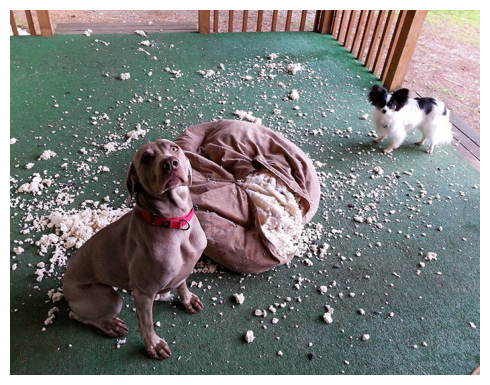

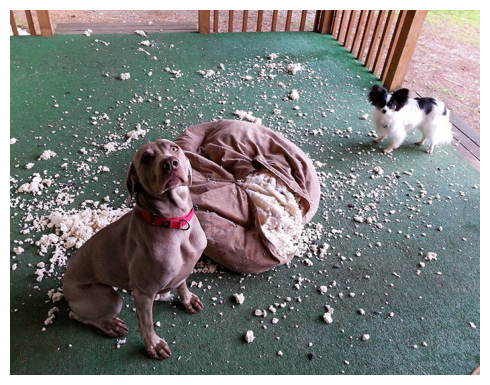

In [ ]:
filepath = keras.utils.get_file(origin="https://img.mebhome.ru/articles/divany/pet-destroy-6.jpg")
image = keras.utils.load_img(filepath)
image = np.array(image)

visualization.plot_image_gallery(
    np.array([image]),
    value_range=(0, 255),
    rows=1,
    cols=1,
    scale=5,
)

Чтобы использовать архитектуру YOLOV8Detector с магистральной сетью ResNet50, вам необходимо
измените размер изображения до размера, кратного 64. Это необходимо для обеспечения
совместимость с количеством операций уменьшения масштаба, выполняемых сверткой
слои в ResNet.

Если операция изменения размера искажает
соотношение сторон входного сигнала, модель будет работать значительно хуже. Для
предварительно обученный пресет `"yolo_v8_m_pascalvoc"`, который мы используем, последний
`MeanAveragePrecision` в оценочном наборе `pascalvoc/2012` падает до `0,15`
с `0,38` при использовании простой операции изменения размера.

Кроме того, если вы обрезаете изображение, чтобы сохранить соотношение сторон, как при классификации
в вашей модели могут полностью отсутствовать некоторые ограничивающие рамки. Таким образом, при выполнении вывода
в модели обнаружения объектов мы рекомендуем использовать отступы до желаемого размера,
при изменении размера самого длинного размера в соответствии с соотношением сторон.

KerasCV упрощает изменение размера; просто передайте `pad_to_aspect_ratio=True` в
слой `keras_cv.layers.Resizing`.

Это можно реализовать в одной строке кода:

In [ ]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

Это можно использовать в качестве конвейера предварительной обработки вывода:

In [ ]:
image_batch = inference_resizing([image])

`keras_cv.visualization.plot_bounding_box_gallery()` поддерживает `class_mapping`
параметр, чтобы указать, к какому классу было присвоено каждое поле. Давайте соберем
отображение классов сейчас.

In [ ]:
class_ids = [
    "Aeroplane",
    "Bicycle",
    "Bird",
    "Boat",
    "Bottle",
    "Bus",
    "Car",
    "Cat",
    "Chair",
    "Cow",
    "Dining Table",
    "Dog",
    "Horse",
    "Motorbike",
    "Person",
    "Potted Plant",
    "Sheep",
    "Sofa",
    "Train",
    "Tvmonitor",
    "Total",
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))

Как и в случае с любой другой keras.Model, вы можете предсказать ограничивающие рамки, используя
`model.predict()` API.

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


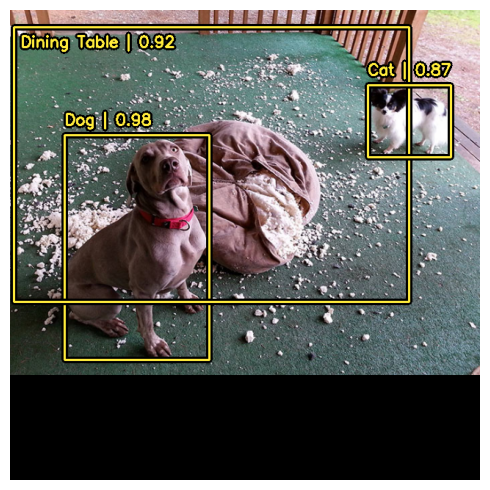

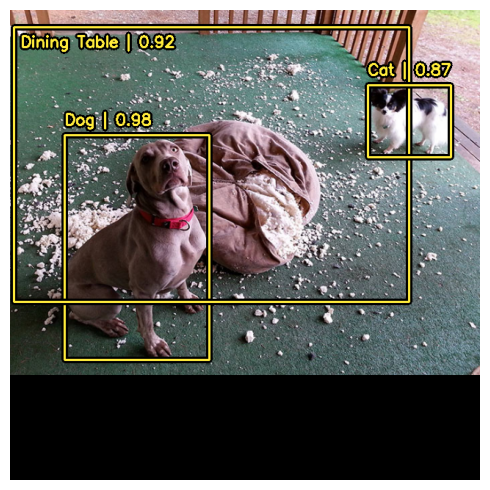

In [ ]:
y_pred = pretrained_model.predict(image_batch)
# y_pred is a bounding box Tensor:
# {"classes": ..., boxes": ...}
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

Чтобы поддержать этот простой и интуитивно понятный рабочий процесс вывода, KerasCV
выполняет немаксимальное подавление внутри класса YOLOV8Detector.
Немаксимальное подавление — это традиционный вычислительный алгоритм, решающий проблему.
модели, обнаруживающей несколько ящиков для одного и того же объекта.

Немаксимальное подавление — это легко настраиваемый алгоритм, и в большинстве случаев вы
захочу настроить параметры немаксимальной модели вашей модели
Операция по подавлению.
Это можно сделать путем переопределения аргумента `prediction_decoder`.

Чтобы продемонстрировать эту концепцию, давайте временно отключим немаксимальное подавление на нашем
YOLOV8Детектор. Это можно сделать, записав в атрибут prediction_decoder.

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


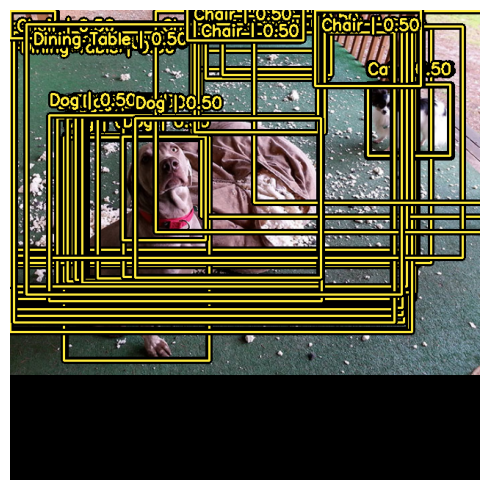

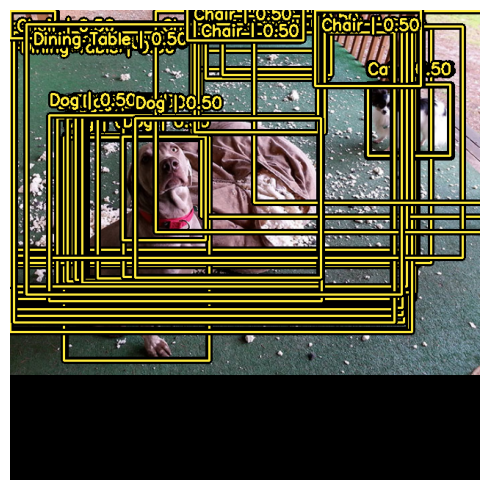

In [ ]:
# The following NonMaxSuppression layer is equivalent to disabling the operation
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=1.0,
    confidence_threshold=0.0,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)


Далее давайте перенастроим keras_cv.layers.NonMaxSuppression для нашего
вариант использования!
В этом случае мы настроим iou_threshold на 0,2, а
`confidence_threshold` на `0,7`.

Повышение `confidence_threshold` приведет к тому, что модель будет выводить только поля.
которые имеют более высокий показатель достоверности. `iou_threshold` контролирует порог
пересечение через объединение (IoU), которое должно быть у двух ящиков, чтобы один был
обрезано.
[Дополнительную информацию об этих параметрах можно найти в документации API TensorFlow] (https://www.tensorflow.org/api_docs/python/tf/image/combined_non_max_suppression)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


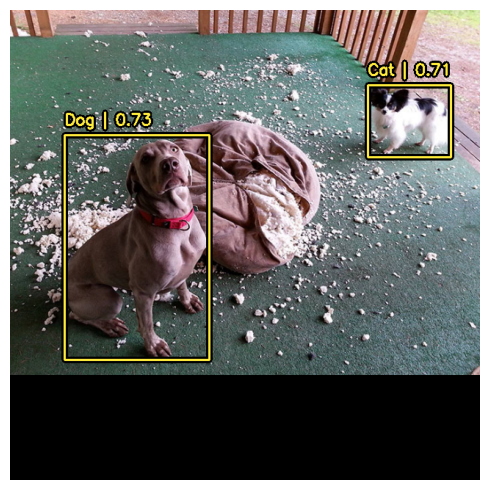

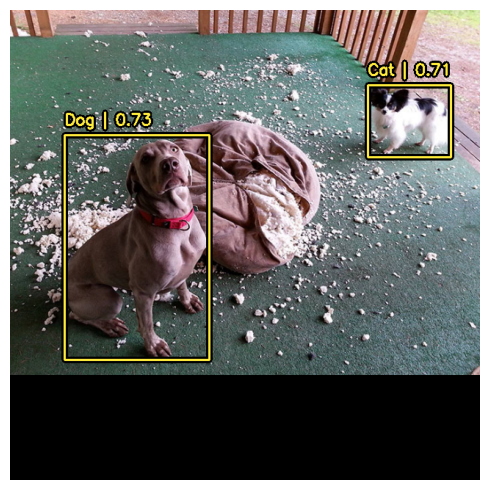

In [ ]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2,
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.7,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

Это выглядит намного лучше!

## Обучение пользовательской модели обнаружения объектов

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_advanced.png)

Являетесь ли вы любителем обнаружения объектов или опытным ветераном, сборка
Создание конвейера обнаружения объектов с нуля — это масштабная задача.
К счастью, все API обнаружения объектов KerasCV построены как модульные компоненты.
Нужен ли вам полный конвейер, просто модель обнаружения объектов или даже
просто утилита преобразования для преобразования ваших коробок из формата «xywh» в «xyxy»,
KerasCV поможет вам.

В этом руководстве мы соберем полный конвейер обучения для объекта KerasCV.
модель обнаружения. Сюда входит загрузка данных, увеличение, оценка показателей,
и вывод!

Для начала давайте разберемся со всем нашим импортом и определим глобальные
параметры конфигурации.

In [ ]:
BATCH_SIZE = 4

## Загрузка данных

Для начала давайте обсудим загрузку данных и форматирование ограничивающей рамки.
KerasCV имеет предопределенный формат ограничивающих рамок.
Чтобы соответствовать этому, вы
следует упаковать ограничивающие рамки в словарь, соответствующий
спецификация ниже:

```
bounding_boxes = {
    # num_boxes может быть измерением Ragged
    'коробки': Tensor(shape=[batch, num_boxes, 4]),
    'классы': Tensor(shape=[batch, num_boxes])
}
```

`bounding_boxes['boxes']` содержит координаты вашей ограничивающей рамки в KerasCV.
поддерживается `bounding_box_format`.
KerasCV требует аргументаbounding_box_format во всех компонентах, которые обрабатывают
ограничивающие рамки.
Это сделано для того, чтобы максимизировать ваши возможности по подключению и работе отдельных компонентов.
в свои конвейеры обнаружения объектов, а также сделать код самодокументируемым.
по конвейерам обнаружения объектов.

Чтобы соответствовать стилю API KerasCV, рекомендуется при написании
пользовательский загрузчик данных, вы также поддерживаете аргумент «bounding_box_format».
Это дает понять тем, кто вызывает ваш загрузчик данных, какой формат ограничивающих рамок.
находятся в.
В этом примере мы форматируем наши поля в формат xywh.

Например:

``` питон
train_ds, ds_info = your_data_loader.load(
    Split='train',bounding_box_format='xywh',atch_size=8
)
```

Это явно дает ограничивающие рамки в формате «xywh». Вы можете прочитать больше о
Форматы ограничивающей рамки KerasCV [в документации API] (https://keras.io/api/keras_cv/bounding_box/formats/).

Наши данные загружаются в формате
`{"images": изображения, "bounding_boxes":bounding_boxes}`. Этот формат
поддерживается во всех компонентах предварительной обработки KerasCV.

Давайте загрузим некоторые данные и проверим, что они выглядят так, как мы ожидаем.

In [ ]:

def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )


def unpackage_raw_tfds_inputs(inputs, bounding_box_format):
    image = inputs["image"]
    boxes = keras_cv.bounding_box.convert_format(
        inputs["objects"]["bbox"],
        images=image,
        source="rel_yxyx",
        target=bounding_box_format,
    )
    bounding_boxes = {
        "classes": inputs["objects"]["label"],
        "boxes": boxes,
    }
    return {"images": image, "bounding_boxes": bounding_boxes}


def load_pascal_voc(split, dataset, bounding_box_format):
    ds = tfds.load(dataset, split=split, with_info=False, shuffle_files=True)
    ds = ds.map(
        lambda x: unpackage_raw_tfds_inputs(x, bounding_box_format=bounding_box_format),
        num_parallel_calls=tf_data.AUTOTUNE,
    )
    return ds


train_ds = load_pascal_voc(
    split="train", dataset="voc/2007", bounding_box_format="xywh"
)
eval_ds = load_pascal_voc(split="test", dataset="voc/2007", bounding_box_format="xywh")

train_ds = train_ds.shuffle(BATCH_SIZE * 4)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...:   0%|          | 0/4952 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incompleteZZ62MG/voc-test.tfrecord*...:   0%|          | 0/…

Generating train examples...:   0%|          | 0/2501 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incompleteZZ62MG/voc-train.tfrecord*...:   0%|          | 0…

Generating validation examples...:   0%|          | 0/2510 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incompleteZZ62MG/voc-validation.tfrecord*...:   0%|        …

Dataset voc downloaded and prepared to /root/tensorflow_datasets/voc/2007/4.0.0. Subsequent calls will reuse this data.


Далее давайте группируем наши данные.

В задачах обнаружения объектов KerasCV рекомендуется
пользователи используют разрозненные пакеты входных данных.
Это связано с тем, что в PascalVOC изображения могут быть разного размера,
а также тот факт, что может быть разное количество ограничивающих рамок на
изображение.

Чтобы создать неоднородный набор данных в конвейере tf.data, вы можете использовать команду
метод `ragged_batch()`.

In [ ]:
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
eval_ds = eval_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)

Давайте убедимся, что наш набор данных соответствует формату, который ожидает KerasCV.
Используя функцию `visualize_dataset()`, вы можете визуально проверить
что ваши данные находятся в формате, ожидаемом KerasCV. Если ограничивающие рамки
не видны или видны не в тех местах, что является признаком того, что ваш
данные имеют неверный формат.

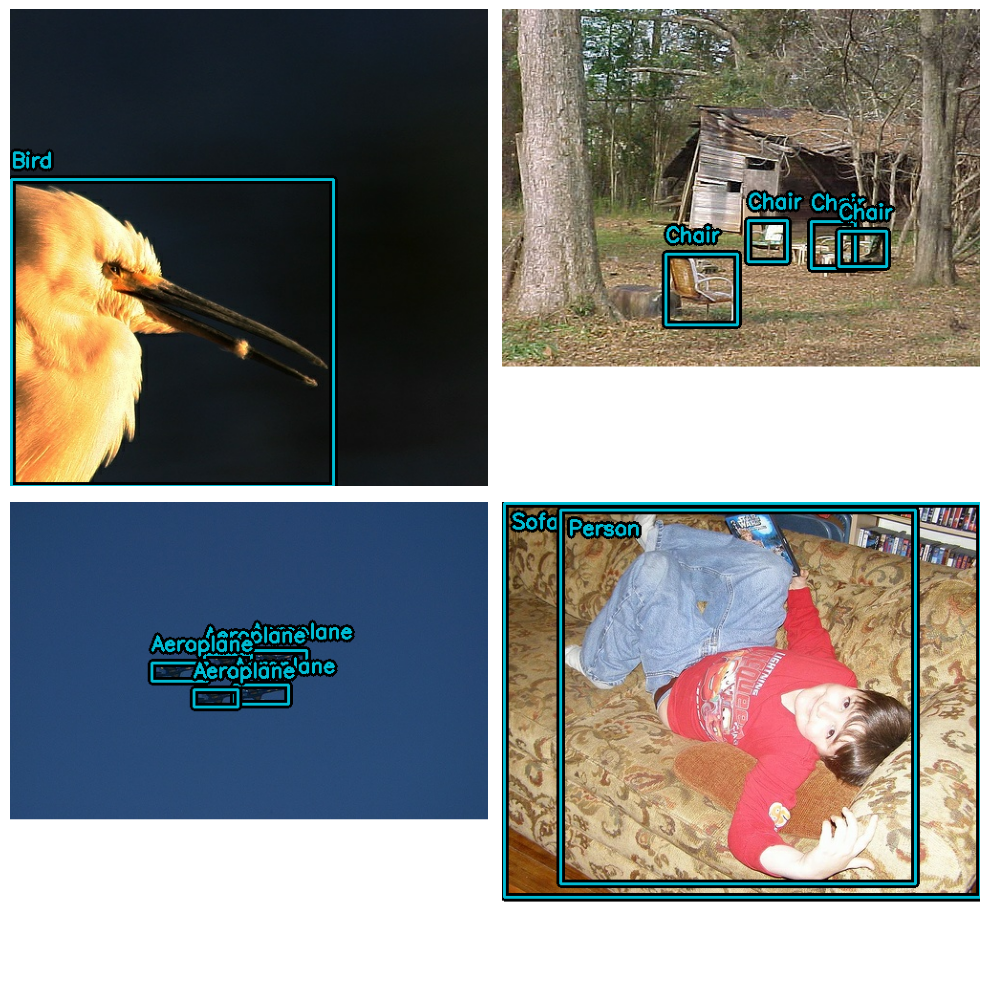

In [ ]:
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

И для оценочного набора:

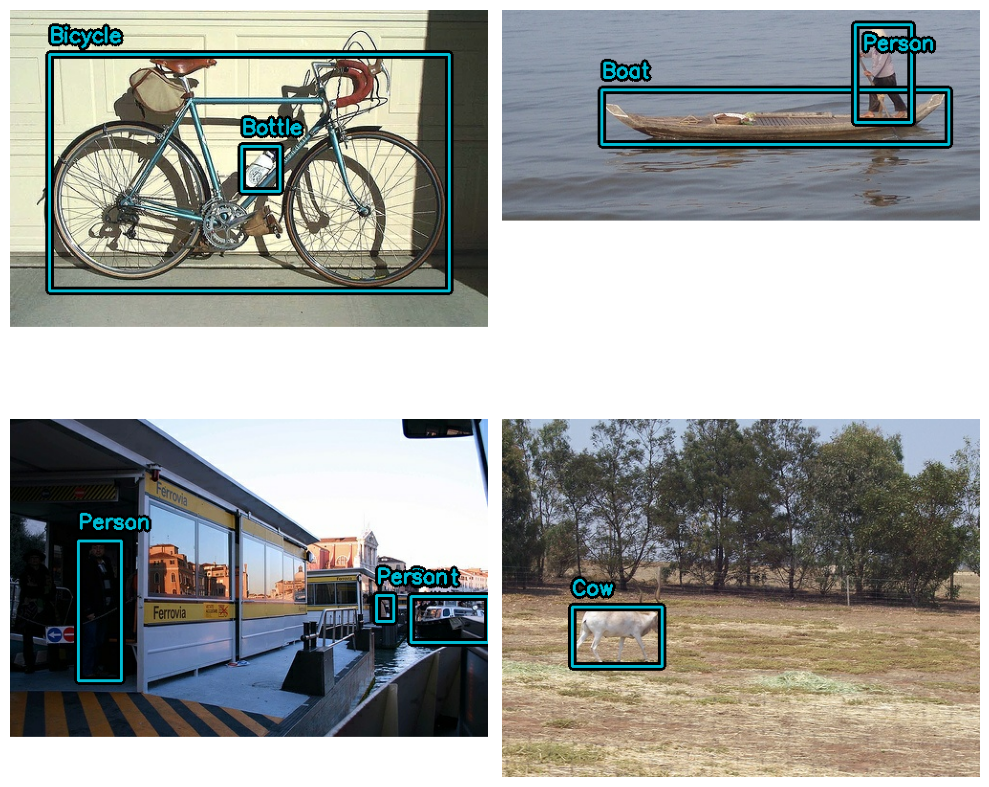

In [ ]:
visualize_dataset(
    eval_ds,
    bounding_box_format="xywh",
    value_range=(0, 255),
    rows=2,
    cols=2,
    # If you are not running your experiment on a local machine, you can also
    # make `visualize_dataset()` dump the plot to a file using `path`:
    # path="eval.png"
)

Похоже, все структурировано так, как и ожидалось.
Теперь мы можем перейти к построению нашего
конвейер увеличения данных.

## Увеличение данных

Одна из самых сложных задач при построении системы обнаружения объектов
конвейеры — это увеличение данных. Методы увеличения изображения должны учитывать лежащие в основе
ограничивающие рамки и должны обновить их соответствующим образом.

К счастью, KerasCV изначально поддерживает расширение ограничивающей рамки с помощью своих обширных возможностей.
библиотека
[слоев расширения данных] (https://keras.io/api/keras_cv/layers/preprocessing/).
Код ниже загружает набор данных Pascal VOC и выполняет операцию «на лету».
увеличение данных с учетом ограничивающей рамки внутри конвейера tf.data.

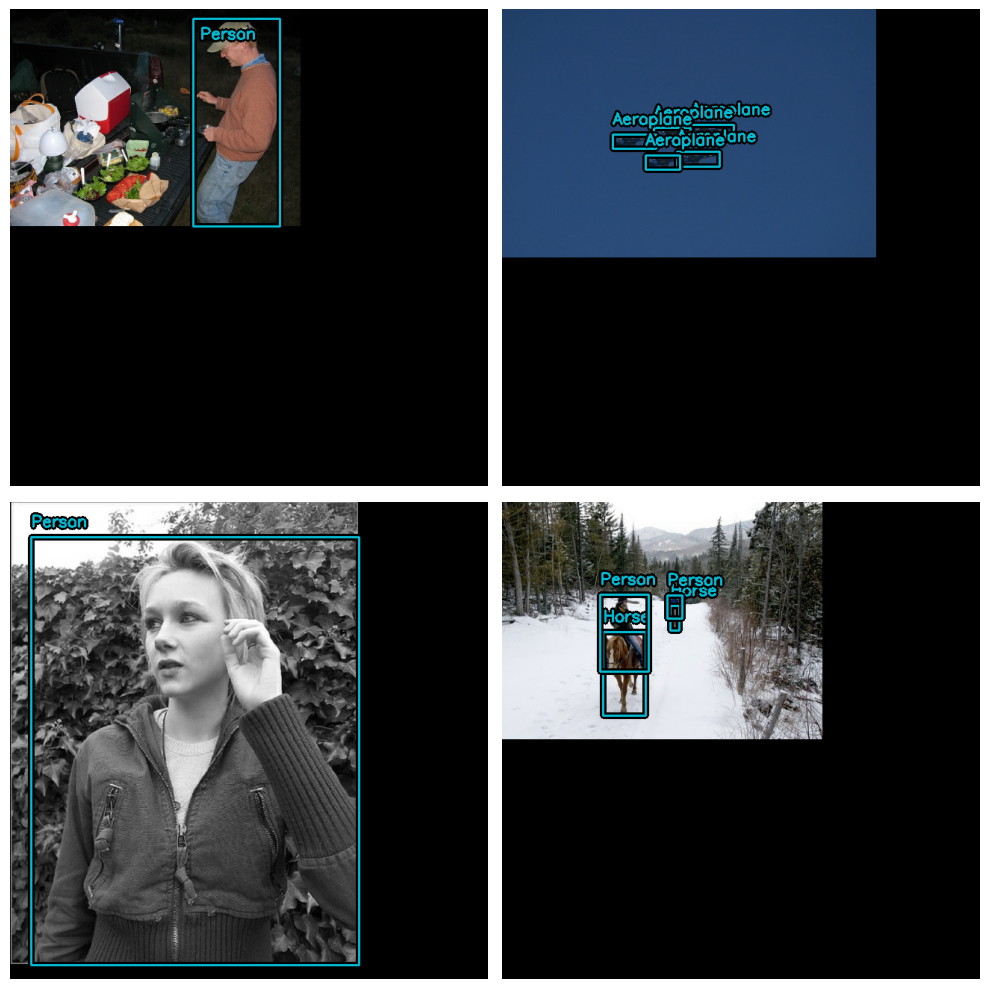

In [ ]:
augmenters = [
    keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh"),
    keras_cv.layers.JitteredResize(
        target_size=(640, 640), scale_factor=(0.75, 1.3), bounding_box_format="xywh"
    ),
]


def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs

    return augmenter_fn


augmenter_fn = create_augmenter_fn(augmenters)

train_ds = train_ds.map(augmenter_fn, num_parallel_calls=tf_data.AUTOTUNE)
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

Большой! Теперь у нас есть конвейер пополнения данных, удобный для использования с ограничивающей рамкой.
Давайте отформатируем наш набор оценочных данных так, чтобы он соответствовал. Вместо использования
`JitteredResize`, давайте использовать детерминированный `keras_cv.layers.Resizing()`
слой.

In [ ]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, bounding_box_format="xywh", pad_to_aspect_ratio=True
)
eval_ds = eval_ds.map(inference_resizing, num_parallel_calls=tf_data.AUTOTUNE)

В связи с тем, что операция изменения размера различается в зависимости от набора данных поезда,
который использует JitteredResize() для изменения размера изображений, и набор данных вывода, который
использует `layers.Resizing(pad_to_aspect_ratio=True)`, рекомендуется
визуализируйте оба набора данных:

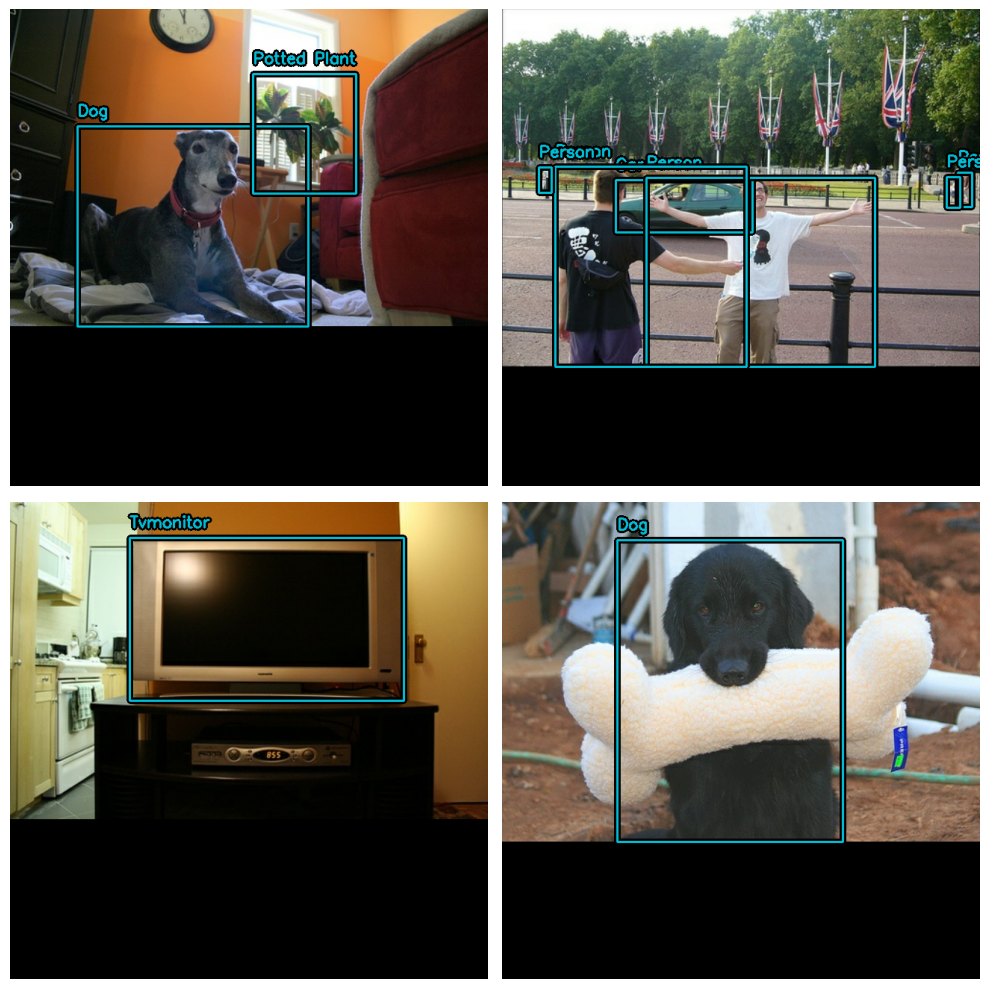

In [ ]:
visualize_dataset(
    eval_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

Наконец, давайте распакуем наши входные данные из словаря предварительной обработки и
подготовьтесь к подаче входных данных в нашу модель. Чтобы быть совместимым с ТПУ,
Ограничивающая рамка Тензоры должны быть «Плотными», а не «Рваными».

In [ ]:

def dict_to_tuple(inputs):
    return inputs["images"], bounding_box.to_dense(
        inputs["bounding_boxes"], max_boxes=32
    )


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
eval_ds = eval_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)

train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
eval_ds = eval_ds.prefetch(tf_data.AUTOTUNE)

### Оптимизатор

В этом руководстве мы используем стандартный оптимизатор SGD и полагаемся на
[`keras.callbacks.ReduceLROnPlateau`](https://keras.io/api/callbacks/reduce_lr_on_plateau/)
обратный вызов для снижения скорости обучения.

Вы всегда захотите включить global_clipnorm при обучении объекта.
модели обнаружения. Это сделано для устранения проблем с взрывным градиентом, которые часто
возникают при обучении моделей обнаружения объектов.

In [ ]:
base_lr = 0.005
# including a global_clipnorm is extremely important in object detection tasks
optimizer = keras.optimizers.SGD(
    learning_rate=base_lr, momentum=0.9, global_clipnorm=10.0
)

Чтобы добиться наилучших результатов в вашем наборе данных, вам, вероятно, захочется вручную создать
График скорости обучения PiecewiseConstantDecay.
Хотя расписания PiecewiseConstantDecay, как правило, работают лучше, они не
переводить между задачами.

### Функции потерь

Возможно, вы не знакомы с потерей «ciou». Хотя это не распространено в других
моделях эта потеря иногда используется в мире обнаружения объектов.

Короче говоря, ["Complete IoU"](https://arxiv.org/abs/1911.08287) представляет собой вариант пересечения с потерей объединения и используется из-за его свойств сходимости.

В KerasCV вы можете использовать эту потерю, просто передав строку `"ciou"` в `compile()`.
Мы также используем стандартную двоичную кроссэнтропийную потерю для главы класса.

In [ ]:
pretrained_model.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
)

### Оценка показателей

Наиболее популярными метриками обнаружения объектов являются метрики COCO,
которые были опубликованы вместе с набором данных MSCOCO. KerasCV предоставляет
простой в использовании набор метрик COCO под именем keras_cv.callbacks.PyCOCOCallback.
символ. Обратите внимание, что для вычисления мы используем обратный вызов Keras вместо метрики Keras.
КОКО-метрики. Это связано с тем, что для расчета метрик COCO требуется хранить всю
прогнозы модели для всего набора оценочных данных в памяти одновременно, что
во время тренировки это делать нецелесообразно.

In [ ]:
coco_metrics_callback = keras_cv.callbacks.PyCOCOCallback(
    eval_ds.take(20), bounding_box_format="xywh"
)


Наш конвейер данных готов!
Теперь мы можем перейти к созданию и обучению модели.

## Создание модели

Далее давайте воспользуемся API KerasCV для создания необученной модели YOLOV8Detector.
В этом уроке мы используем предварительно обученную магистраль ResNet50 из imagenet.
набор данных.

KerasCV позволяет легко создать YOLOV8Detector с помощью любого из KerasCV.
позвоночника. Просто используйте один из пресетов для желаемой архитектуры!

Например:

In [ ]:
model = keras_cv.models.YOLOV8Detector.from_preset(
    "resnet50_imagenet",
    # For more info on supported bounding box formats, visit
    # https://keras.io/api/keras_cv/bounding_box/
    bounding_box_format="xywh",
    num_classes=20,
)

100%|██████████| 777/777 [00:00<00:00, 172kB/s]
100%|██████████| 90.3M/90.3M [00:03<00:00, 27.4MB/s]


Это все, что нужно для создания KerasCV YOLOv8. YOLOv8 принимает
кортежи плотных изображений. Тензоры и словари ограничивающих рамок для `fit()` и
`train_on_batch()`

Это соответствует тому, что мы построили в нашем входном конвейере выше.

## Обучение нашей модели

Осталось только обучить нашу модель. Модели обнаружения объектов KerasCV
следуйте стандартному рабочему процессу Keras, используя `compile()` и `fit()`.

Скомпилируем нашу модель:

In [ ]:
model.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
    optimizer=optimizer,
)

Если вы хотите полностью обучить модель, удалите `.take(20)` из всего набора данных.
ссылки (ниже и при инициализации обратного вызова метрик).

In [ ]:
model.fit(
    train_ds.take(20),
    # Run for 10-35~ epochs to achieve good scores.
    epochs=1,
    callbacks=[coco_metrics_callback],
)

20/20 ━━━━━━━━━━━━━━━━━━━━ 660s 33s/step
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.39s).
Accumulating evaluation results...
DONE (t=0.17s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 

## Вывод и построение результатов

KerasCV упрощает процесс обнаружения объектов. `model.predict(изображения)`
возвращает тензор ограничивающих рамок. По умолчанию `YOLOV8Detector.predict()`
выполнит для вас операцию не максимального подавления.

В этом разделе мы будем использовать пресет, предоставленный keras_cv:

In [ ]:
model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh"
)

Далее для удобства строим набор данных с более крупными пакетами:

In [ ]:
visualization_ds = eval_ds.unbatch()
visualization_ds = visualization_ds.ragged_batch(16)
visualization_ds = visualization_ds.shuffle(8)

Давайте создадим простую функцию для построения наших выводов:

In [ ]:

def visualize_detections(model, dataset, bounding_box_format):
    images, y_true = next(iter(dataset.take(1)))
    y_pred = model.predict(images)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        scale=4,
        rows=2,
        cols=2,
        show=True,
        font_scale=0.7,
        class_mapping=class_mapping,
    )


Вам может потребоваться настроить операцию NonMaxSuppression для достижения
визуально привлекательные результаты.

1/1 ━━━━━━━━━━━━━━━━━━━━ 40s 40s/step


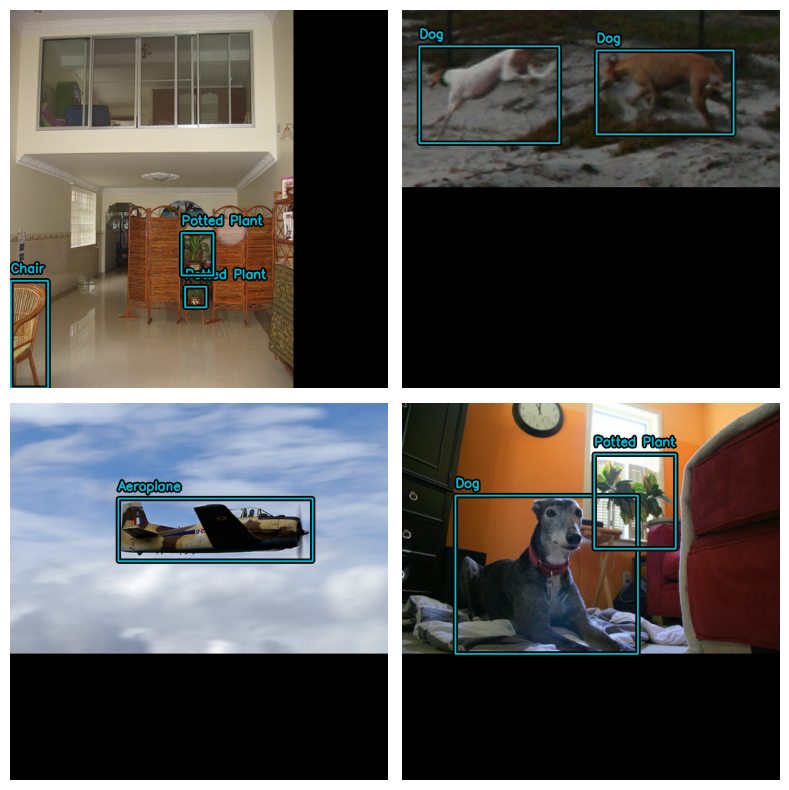

In [ ]:
model.prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=0.5,
    confidence_threshold=0.75,
)

visualize_detections(model, dataset=visualization_ds, bounding_box_format="xywh")

Потрясающий!
И последний полезный шаблон, о котором следует помнить, — это визуализировать
обнаружения в `keras.callbacks.Callback` для мониторинга обучения:

In [ ]:

class VisualizeDetections(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        visualize_detections(
            self.model, bounding_box_format="xywh", dataset=visualization_ds
        )


## Выводы и следующие шаги

KerasCV позволяет легко создавать современные конвейеры обнаружения объектов.
В этом руководстве мы начали с написания загрузчика данных с использованием KerasCV.
спецификация ограничивающей рамки.
После этого мы собрали конвейер увеличения данных промышленного уровня, используя
Уровни предварительной обработки KerasCV в <50 строках кода.

Компоненты обнаружения объектов KerasCV могут использоваться независимо, но также имеют глубокие
интеграция друг с другом.
KerasCV обеспечивает увеличение ограничивающей рамки авторского уровня,
обучение моделей, визуализация и
метрическая оценка проста.

Некоторые дополнительные упражнения для читателя:

- добавить дополнительные методы увеличения для улучшения производительности модели.
- настроить гиперпараметры и увеличение данных, используемые для получения результатов высокого качества.
- обучить модель обнаружения объектов на собственном наборе данных

Последний забавный фрагмент кода, демонстрирующий возможности API KerasCV!

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL++-M license at https://github.com/Stability-AI/stablediffusion/blob/main/LICENSE-MODEL
1356917/1356917 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
1361968152/1361968152 ━━━━━━━━━━━━━━━━━━━━ 20s 0us/step
3464605600/3464605600 ━━━━━━━━━━━━━━━━━━━━ 143s 0us/step
50/50 ━━━━━━━━━━━━━━━━━━━━ 7056s 136s/step
198180272/198180272 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


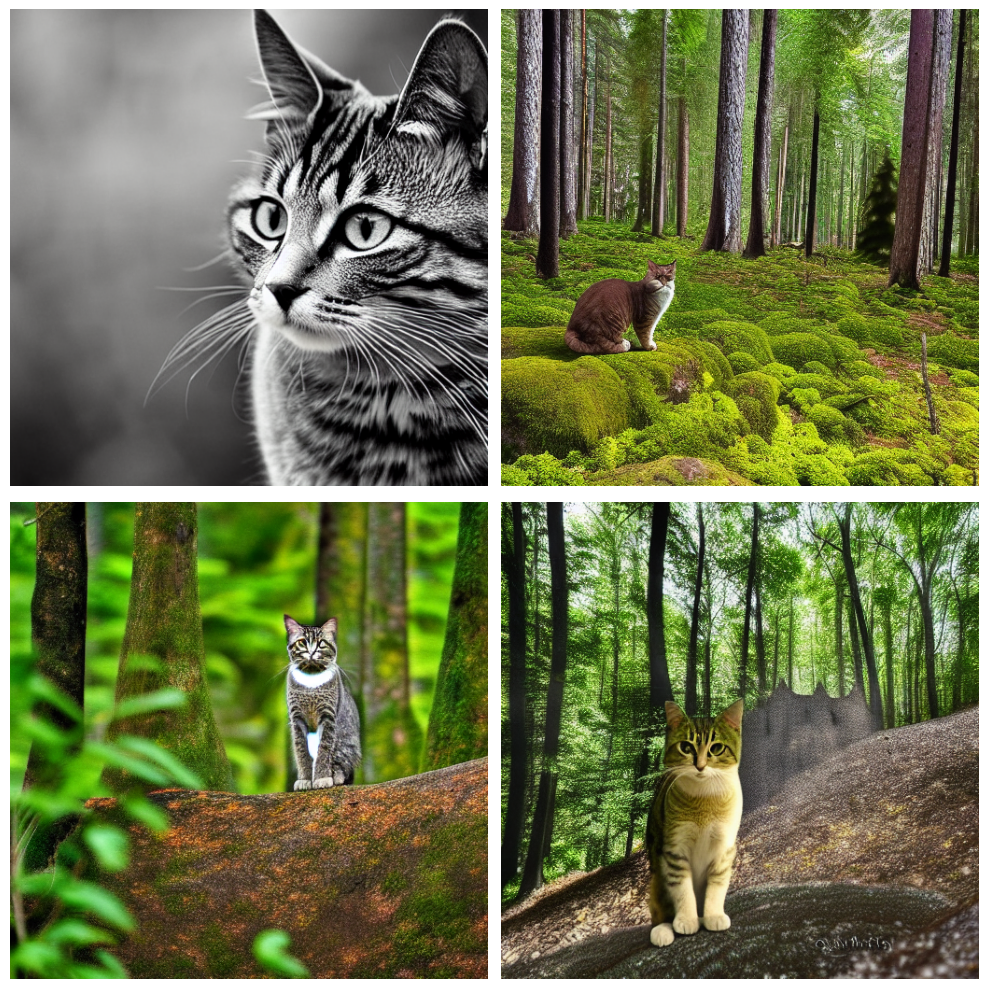

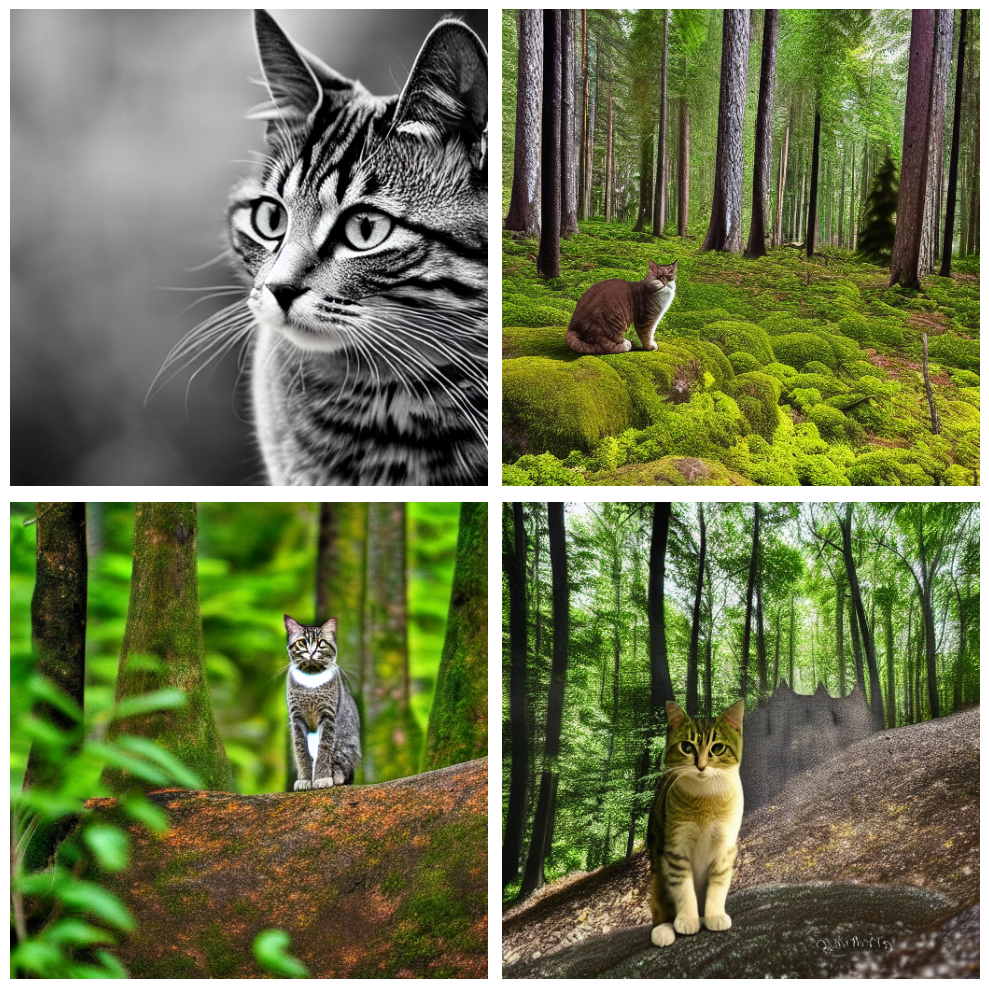

In [ ]:
stable_diffusion = keras_cv.models.StableDiffusionV2(512, 512)
images = stable_diffusion.text_to_image(
    prompt="A zoomed out photograph of a cool looking cat.  The cat stands in a beautiful forest",
    negative_prompt="unrealistic, bad looking, malformed",
    batch_size=4,
    seed=1231,
)
encoded_predictions = model(images)
y_pred = model.decode_predictions(encoded_predictions, images)
visualization.plot_bounding_box_gallery(
    images,
    value_range=(0, 255),
    y_pred=y_pred,
    rows=2,
    cols=2,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

In [7]:
!pip install keras_cv


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.1/613.1 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 18.0 MB/s eta 0:00:00


In [10]:
import tensorflow as tf
import tensorflow_datasets as tfds
from keras_cv import visualization
from keras_cv import bounding_box
from tensorflow.keras import utils as keras_utils

In [11]:
BATCH_SIZE = 8  # Изменим размер пакета данных на 8

In [12]:
class_ids = [
    "Aeroplane",
    "Bicycle",
    "Bird",
    "Boat",
    "Bottle",
    "Bus",
    "Car",
    "Cat",
    "Chair",
    "Cow",
    "Dining Table",
    "Dog",
    "Horse",
    "Motorbike",
    "Person",
    "Potted Plant",
    "Sheep",
    "Sofa",
    "Train",
    "Tvmonitor",
    "Total",
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))

In [13]:
def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format, class_mapping):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )

def unpackage_raw_tfds_inputs(inputs, bounding_box_format):
    image = inputs["image"]
    boxes = bounding_box.convert_format(
        inputs["objects"]["bbox"],
        images=image,
        source="rel_yxyx",
        target=bounding_box_format,
    )
    bounding_boxes = {
        "classes": inputs["objects"]["label"],
        "boxes": boxes,
    }
    return {"images": image, "bounding_boxes": bounding_boxes}

def load_pascal_voc(split, dataset, bounding_box_format):
    ds = tfds.load(dataset, split=split, with_info=False, shuffle_files=True)
    ds = ds.map(
        lambda x: unpackage_raw_tfds_inputs(x, bounding_box_format=bounding_box_format),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    return ds

In [14]:
train_ds = load_pascal_voc(
    split="train", dataset="voc/2007", bounding_box_format="xywh"
)

In [15]:
eval_ds = load_pascal_voc(split="test", dataset="voc/2007", bounding_box_format="xywh")

In [16]:
train_ds = train_ds.shuffle(BATCH_SIZE * 4)
train_ds = train_ds.padded_batch(BATCH_SIZE, padded_shapes={"images": [None, None, 3], "bounding_boxes": {"classes": [None], "boxes": [None, 4]}})
eval_ds = eval_ds.padded_batch(BATCH_SIZE, padded_shapes={"images": [None, None, 3], "bounding_boxes": {"classes": [None], "boxes": [None, 4]}})

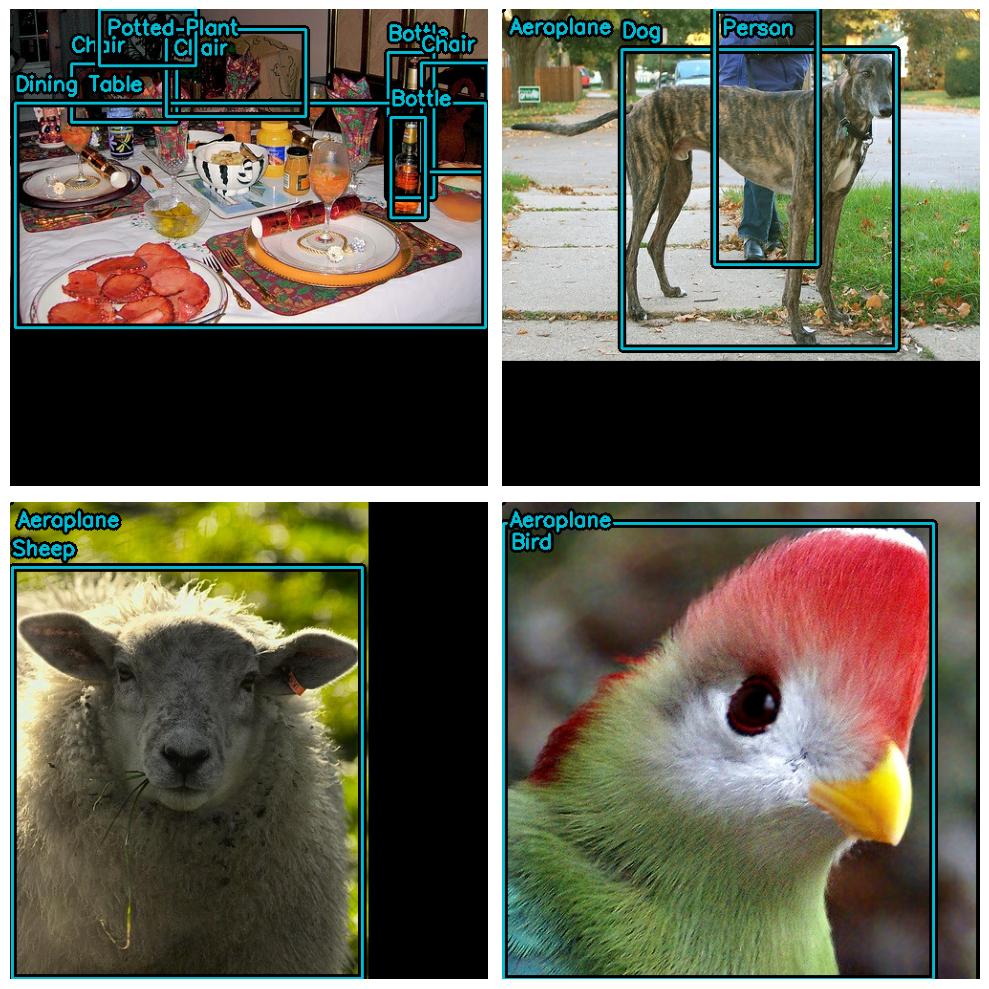

In [17]:
visualize_dataset(
    train_ds,
    bounding_box_format="xywh",
    value_range=(0, 255),
    rows=2,
    cols=2,
    class_mapping=class_mapping,
)

## __Внесены следующие изменения в код__:

Увеличен размер пакета данных BATCH_SIZE до 8 для увеличения эффективности обработки данных.</br>
Добавлен аргумент class_mapping в функцию visualize_dataset для передачи карты классов, что может потребоваться для корректной визуализации данных.</br>
Теперь, когда мы запускаем функцию visualize_dataset, она использует увеличенный размер пакета данных и визуализирует данные в ожидаемом формате для KerasCV.

### __Вывод__:

Увеличение размера пакета данных может улучшить производительность обучения модели за счет эффективного использования ресурсов.</br>
Добавление аргумента _class_mapping_ в функцию визуализации позволяет корректно отображать метки классов визуализируемых объектов.</br>
Визуализация данных после внесения изменений позволяет убедиться в правильном формате данных перед обучением модели, что помогает избежать ошибок в процессе обучения.